In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.dummy import DummyRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge

In [2]:
#Importing dataset

df = pd.read_csv('../Data/final_ncaa_data.csv')

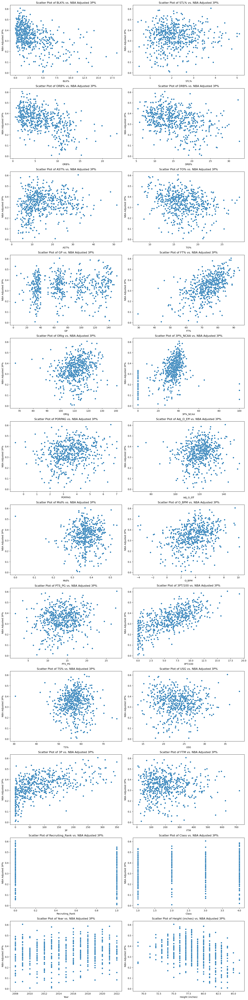

In [3]:

def create_scatter_plots(df, target_variable):
    # Filter out non-numeric columns
    numeric_columns = df.select_dtypes(include=['number']).columns.tolist()
    feature_names = [col for col in numeric_columns if col != target_variable]

    num_features = len(feature_names)
    num_rows = num_features // 2 + num_features % 2  # Calculate the number of rows for subplots
    num_cols = 2  # Two plots per row

    plt.figure(figsize=(15, 5 * num_rows))

    for i, feature in enumerate(feature_names):
        plt.subplot(num_rows, num_cols, i + 1)
        sns.scatterplot(data=df, x=feature, y=target_variable)
        plt.title(f'Scatter Plot of {feature} vs. {target_variable}')
        
        # Calculate axis limits with a buffer
        x_min, x_max = df[feature].min() - 0.05 * (df[feature].max() - df[feature].min()), df[feature].max() + 0.05 * (df[feature].max() - df[feature].min())
        y_min, y_max = df[target_variable].min() - 0.05 * (df[target_variable].max() - df[target_variable].min()), df[target_variable].max() + 0.05 * (df[target_variable].max() - df[target_variable].min())
        
        plt.xlim(x_min, x_max)
        plt.ylim(y_min, y_max)
        
        plt.xlabel(feature)
        plt.ylabel(target_variable)

    plt.tight_layout()
    plt.show()

# Example usage:
target_variable = 'NBA Adjusted 3P%'  # Replace with your target variable name
create_scatter_plots(df, target_variable)

In [4]:
#We will remove USG and TS%. Year was already removed because, when applying this model to a real-world set,
#each player will have the same year.

features = df.drop(columns=['Player', 'Year', 'NBA Adjusted 3P%','ORtg', 'TS%', 'ORB%', 'STL%', 'TO%'])
features

X = features
y = df['NBA Adjusted 3P%']  # Target variable (dependent variable)


In [5]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [6]:
lr_pipe = Pipeline([
    ('scaler', StandardScaler()), 
    ('lr', LinearRegression())  
])

In [7]:
lr_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('lr', LinearRegression())])

In [8]:
#Score on training
training_score = lr_pipe.score(X_train, y_train)

# Get average cross-validation score
cv_scores = cross_val_score(lr_pipe, X_train, y_train, cv=5)  # You can adjust the number of folds as needed
average_cv_score = cv_scores.mean()

print("Average CV score:", average_cv_score)
print("Training score:", training_score)

Average CV score: 0.5324724606143016
Training score: 0.5835275126353964


In [9]:
# Predict on the training set
y_train_pred = lr_pipe.predict(X_train)

# Compute MSE
mse_train = mean_squared_error(y_train, y_train_pred)

# Compute RMSE
rmse_train = np.sqrt(mse_train)

# Compute R-squared
r2_train = r2_score(y_train, y_train_pred)

# Get training score
training_score = lr_pipe.score(X_train, y_train)

cv_r2_scores = cross_val_score(lr_pipe, X_train, y_train, cv=5, scoring='r2')  # You can adjust the number of folds as needed

# Compute MSE and RMSE for cross-validation
cv_mse_scores = -cross_val_score(lr_pipe, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = np.sqrt(cv_mse_scores)

# Average R-squared, MSE, and RMSE for cross-validation
average_cv_r2 = cv_r2_scores.mean()
average_cv_mse = cv_mse_scores.mean()
average_cv_rmse = cv_rmse_scores.mean()

print("R-squared on cross-validation data:", average_cv_r2)
print("MSE on cross-validation data:", average_cv_mse)
print("RMSE on cross-validation data:", average_cv_rmse)

print("MSE on training data:", mse_train)
print("RMSE on training data:", rmse_train)
print("R-squared on training data:", r2_train)

R-squared on cross-validation data: 0.5324724606143016
MSE on cross-validation data: 0.005239338907640089
RMSE on cross-validation data: 0.07231756166514333
MSE on training data: 0.004815840953840397
RMSE on training data: 0.06939626037359936
R-squared on training data: 0.5835275126353964


## Ridge Regression

In [10]:
ridge_pipe = Pipeline([
    ('scaler', StandardScaler()),  # Step 1: Standardize features
    ('ridge', Ridge())  # Step 2: Ridge Regression
])

In [11]:
ridge_param_grid = {
    'ridge__alpha': [24, 25, 26]  # Example values for alpha
}

In [12]:
grid_search = GridSearchCV(ridge_pipe, ridge_param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('ridge', Ridge())]),
             param_grid={'ridge__alpha': [24, 25, 26]},
             scoring='neg_mean_squared_error')

In [13]:
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_


# Get predictions on the training data
y_train_pred = best_model.predict(X_train)

# Calculate evaluation metrics for training data
mse_train = mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)

# Get cross-validation scores
cv_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
mse_cv = -cv_scores  # Convert negative MSE scores to positive
r2_cv = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')
rmse_cv = np.sqrt(mse_cv)

# Calculate average cross-validation scores
avg_mse_cv = np.mean(mse_cv)
avg_r2_cv = np.mean(r2_cv)
avg_rmse_cv = np.mean(rmse_cv)

print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)
print()

print("Training Metrics:")
print("MSE:", mse_train)
print("R-squared:", r2_train)
print("RMSE:", rmse_train)
print()

print("Cross-Validation Metrics:")
print("Average MSE:", avg_mse_cv)
print("Average R-squared:", avg_r2_cv)
print("Average RMSE:", avg_rmse_cv)



Best Parameters: {'ridge__alpha': 24}
Best Score: -0.005186950293313629

Training Metrics:
MSE: 0.0048427882253882365
R-squared: 0.5811971206401481
RMSE: 0.06959014459956407

Cross-Validation Metrics:
Average MSE: 0.005186950293313629
Average R-squared: 0.5376918373762842
Average RMSE: 0.07193279969274768


## Random Forest Regression

In [18]:
rf_pipe = Pipeline([
    ('scaler', StandardScaler()), 
    ('rf', RandomForestRegressor()) 
])

In [32]:
# Define hyperparameters grid for GridSearchCV

rf_param_grid = {

    'rf__n_estimators': [170, 175, 180, 185, 190, 200, 210, 220],  # Adjusted range around the best value
    'rf__max_depth': [8, 9, 10, 11, 12, 13, 14, 15, 16, 17],  # Adjusted range around the best value
    'rf__min_samples_split': [2, 3, 4, 5, 6, 7, 8],  # Adjusted range around the best value
    'rf__min_samples_leaf': [1,2,3, 4],  # Adjusted range around the best value
    'rf__max_features': [.2, .25, .28, .3, .32, .35, .4],  # Adjusted range around the best value
    'rf__max_leaf_nodes': [None],  # Grow trees with max_leaf_nodes in best-first fashion
    # A node will be split if this split induces a decrease of the impurity greater than or equal to this value
    # Add more hyperparameters as needed
}


In [33]:

grid_search = GridSearchCV(rf_pipe, rf_param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose = 3)
grid_search.fit(X_train, y_train)


Fitting 5 folds for each of 15680 candidates, totalling 78400 fits
[CV 2/5] END rf__max_depth=17, rf__max_features=0.3, rf__max_leaf_nodes=None, rf__min_samples_leaf=2, rf__min_samples_split=1, rf__n_estimators=230;, score=nan total time=   0.0s
[CV 3/5] END rf__max_depth=17, rf__max_features=0.3, rf__max_leaf_nodes=None, rf__min_samples_leaf=2, rf__min_samples_split=1, rf__n_estimators=230;, score=nan total time=   0.0s
[CV 4/5] END rf__max_depth=17, rf__max_features=0.3, rf__max_leaf_nodes=None, rf__min_samples_leaf=2, rf__min_samples_split=1, rf__n_estimators=230;, score=nan total time=   0.0s
[CV 5/5] END rf__max_depth=17, rf__max_features=0.3, rf__max_leaf_nodes=None, rf__min_samples_leaf=2, rf__min_samples_split=1, rf__n_estimators=230;, score=nan total time=   0.0s
[CV 1/5] END rf__max_depth=17, rf__max_features=0.3, rf__max_leaf_nodes=None, rf__min_samples_leaf=2, rf__min_samples_split=2, rf__n_estimators=170;, score=-0.007 total time=   0.2s
[CV 1/5] END rf__max_depth=17, rf__

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('rf', RandomForestRegressor())]),
             n_jobs=-1,
             param_grid={'rf__max_depth': [8, 9, 10, 11, 12, 13, 14, 15, 16,
                                           17],
                         'rf__max_features': [0.2, 0.25, 0.28, 0.3, 0.32, 0.35,
                                              0.4],
                         'rf__max_leaf_nodes': [None],
                         'rf__min_samples_leaf': [1, 2, 3, 4],
                         'rf__min_samples_split': [2, 3, 4, 5, 6, 7, 8],
                         'rf__n_estimators': [170, 175, 180, 185, 190, 200, 210,
                                              220]},
             scoring='neg_mean_squared_error', verbose=3)

[CV 4/5] END rf__max_depth=17, rf__max_features=0.35, rf__max_leaf_nodes=None, rf__min_samples_leaf=2, rf__min_samples_split=2, rf__n_estimators=185;, score=-0.005 total time=   0.2s
[CV 5/5] END rf__max_depth=17, rf__max_features=0.35, rf__max_leaf_nodes=None, rf__min_samples_leaf=2, rf__min_samples_split=2, rf__n_estimators=185;, score=-0.006 total time=   0.2s
[CV 4/5] END rf__max_depth=17, rf__max_features=0.35, rf__max_leaf_nodes=None, rf__min_samples_leaf=2, rf__min_samples_split=2, rf__n_estimators=220;, score=-0.005 total time=   0.2s
[CV 5/5] END rf__max_depth=17, rf__max_features=0.35, rf__max_leaf_nodes=None, rf__min_samples_leaf=2, rf__min_samples_split=2, rf__n_estimators=220;, score=-0.006 total time=   0.3s
[CV 2/5] END rf__max_depth=17, rf__max_features=0.35, rf__max_leaf_nodes=None, rf__min_samples_leaf=2, rf__min_samples_split=3, rf__n_estimators=200;, score=-0.004 total time=   0.2s
[CV 3/5] END rf__max_depth=17, rf__max_features=0.35, rf__max_leaf_nodes=None, rf__mi

In [31]:

# Get best model and its metrics
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
best_score = -grid_search.best_score_

# Calculate training set metrics using best_model
y_train_pred = best_model.predict(X_train)
mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_train_pred)

# Get cross-validation scores
cv_scores_mse = -cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_scores_rmse = np.sqrt(cv_scores_mse)
cv_scores_r2 = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')

# Calculate average cross-validation scores
avg_cv_score_mse = cv_scores_mse.mean()
avg_cv_score_rmse = cv_scores_rmse.mean()
avg_cv_score_r2 = cv_scores_r2.mean()

print("Training Set Metrics:")
print("MSE:", mse_train)
print("RMSE:", rmse_train)
print("R-squared:", r2_train)
print("\nBest Model:")
print("Best Parameters:", best_params)
print("Best Score (MSE):", best_score)
print("\nCross-Validation Scores:")
print("Average CV MSE Score:", avg_cv_score_mse)
print("Average CV RMSE Score:", avg_cv_score_rmse)
print("Average CV R-squared Score:", avg_cv_score_r2)

Training Set Metrics:
MSE: 0.0016223116682003629
RMSE: 0.04027793028694949
R-squared: 0.8597029714618735

Best Model:
Best Parameters: {'rf__max_depth': 10, 'rf__max_features': 0.3, 'rf__max_leaf_nodes': None, 'rf__min_samples_leaf': 2, 'rf__min_samples_split': 6, 'rf__n_estimators': 180}
Best Score (MSE): 0.005568582604559112

Cross-Validation Scores:
Average CV MSE Score: 0.005708750985572248
Average CV RMSE Score: 0.07531486670159174
Average CV R-squared Score: 0.5032660297759798


In [254]:
# Dummy Model RF
dummy_model = DummyRegressor(strategy="mean")
dummy_model.fit(X_train, y_train)  # Fit the dummy model separately

y_pred_dummy = dummy_model.predict(X_test)


mse_dummy = mean_squared_error(y_test, y_pred_dummy)
rmse_dummy = np.sqrt(mean_squared_error(y_test, y_pred_dummy))
r2_train = r2_score(y_test, y_pred_dummy)
print(f'Dummy Model r-squared: {r2_train}')

print("Dummy Model MSE:", mse_dummy)
print("Dummy Model RMSE:", rmse_dummy)

Dummy Model r-squared: -0.04332316274173209
Dummy Model MSE: 0.008199145639350314
Dummy Model RMSE: 0.0905491338409723
[CV 4/5] END rf__max_depth=15, rf__max_features=0.35, rf__max_leaf_nodes=None, rf__min_samples_leaf=1, rf__min_samples_split=5, rf__n_estimators=300;, score=-0.005 total time=   0.5s
[CV 5/5] END rf__max_depth=15, rf__max_features=0.35, rf__max_leaf_nodes=None, rf__min_samples_leaf=1, rf__min_samples_split=6, rf__n_estimators=250;, score=-0.006 total time=   0.4s
[CV 4/5] END rf__max_depth=15, rf__max_features=0.35, rf__max_leaf_nodes=None, rf__min_samples_leaf=1, rf__min_samples_split=7, rf__n_estimators=200;, score=-0.005 total time=   0.3s
[CV 4/5] END rf__max_depth=15, rf__max_features=0.35, rf__max_leaf_nodes=None, rf__min_samples_leaf=1, rf__min_samples_split=7, rf__n_estimators=300;, score=-0.006 total time=   0.4s
[CV 4/5] END rf__max_depth=15, rf__max_features=0.35, rf__max_leaf_nodes=None, rf__min_samples_leaf=1, rf__min_samples_split=8, rf__n_estimators=250;